<a href="https://colab.research.google.com/github/esma-nur/Anomaly-Detection-Anomalib-Library/blob/main/InceptionV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [29]:
"""
import os

# Belirtilen dizindeki dosyaları listeleme
file_list = os.listdir("/content/")

# Dosyaları filtreleyerek sadece black_ ile başlayan dosyaları seçme ve silme
for file_name in file_list:
    if file_name.startswith("black_"):
        file_path = os.path.join("/content/", file_name)
        os.remove(file_path)
        print(f"{file_name} silindi.")

"""

'\nimport os\n\n# Belirtilen dizindeki dosyaları listeleme\nfile_list = os.listdir("/content/")\n\n# Dosyaları filtreleyerek sadece black_ ile başlayan dosyaları seçme ve silme\nfor file_name in file_list:\n    if file_name.startswith("black_"):\n        file_path = os.path.join("/content/", file_name)\n        os.remove(file_path)\n        print(f"{file_name} silindi.")\n\n'

In [30]:
"""
import shutil

# Belirtilen dizini sil
shutil.rmtree("/content/aug")
"""

'\nimport shutil\n\n# Belirtilen dizini sil\nshutil.rmtree("/content/aug")\n'

In [31]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from PIL import Image
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

In [32]:
# Define the paths to the folders
base_dir = "/content/drive/MyDrive/mvtec-wood/wood"
train_dir = os.path.join(base_dir, "train")
test_dir = os.path.join(base_dir, "test")
gt_dir = os.path.join(base_dir, "ground_truth")

# Initialize lists to store data for DataFrame
data = []

# Handle "good" folder
# Gather images from "train" folder
train_good_dir = os.path.join(train_dir, "good")
if os.path.exists(train_good_dir):
    train_good_images = os.listdir(train_good_dir)
    for img_name in train_good_images:
        img_path = os.path.join(train_good_dir, img_name)
        mask_path = ""  # No mask for "good" category in train
        category = "good"
        mask = 0
        data.append([img_path, mask_path, category, mask])

# Gather images from "test/good" folder
test_good_dir = os.path.join(test_dir, "good")
if os.path.exists(test_good_dir):
    test_good_images = os.listdir(test_good_dir)
    for img_name in test_good_images:
        img_path = os.path.join(test_good_dir, img_name)
        mask_path = ""  # No mask for "good" category in test
        category = "good"
        mask = 0
        data.append([img_path, mask_path, category, mask])
# Handle ground truth folders
gt_categories = ["color", "combined", "hole", "liquid", "scratch"]
for category in gt_categories:
    test_category_dir = os.path.join(test_dir, category)
    gt_category_dir = os.path.join(gt_dir, category)
    if os.path.exists(test_category_dir) and os.path.exists(gt_category_dir):
        test_images = os.listdir(test_category_dir)
        for img_name in test_images:
            img_path = os.path.join(test_category_dir, img_name)
            mask_name = img_name.split('.')[0] + "_mask.png"
            mask_path = os.path.join(gt_category_dir, mask_name)
            mask_category = category
            mask = 1
            data.append([img_path, mask_path, mask_category, mask])


# Create a DataFrame
df = pd.DataFrame(data, columns=["image_path", "mask_path", "categories", "mask"])

# Display the DataFrame
print(df)

                                            image_path  \
0    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
1    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
2    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
3    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
4    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
..                                                 ...   
321  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
322  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
323  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
324  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
325  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   

                                             mask_path categories  mask  
0                                                            good     0  
1                                                            good     0  
2                                                            good     0  
3      

In [33]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
# Define image dimensions
width, height = 1024, 1024

# Create a solid black image using NumPy
black_image_array = np.zeros((height, width, 3), dtype=np.uint8)
black_image = Image.fromarray(black_image_array)

In [35]:
df = pd.DataFrame(data, columns=["image_path", "mask_path", "categories", "mask"])

# Fill the blank values in 'mask_path' column with the black image
for index, row in df.iterrows():
    if pd.isnull(row['mask_path']) or row['mask_path'] == '':
        black_image_path = f'black_image_{index}.png'  # Unique path for each image
        black_image.save(black_image_path)
        df.at[index, 'mask_path'] = black_image_path

print("DataFrame after filling blank values in 'mask_path' column:")
print(df)

DataFrame after filling blank values in 'mask_path' column:
                                            image_path  \
0    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
1    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
2    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
3    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
4    /content/drive/MyDrive/mvtec-wood/wood/train/g...   
..                                                 ...   
321  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
322  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
323  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
324  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   
325  /content/drive/MyDrive/mvtec-wood/wood/test/sc...   

                                             mask_path categories  mask  
0                                    black_image_0.png       good     0  
1                                    black_image_1.png       good     0  
2                    

In [36]:
df.head()

,image_path,mask_path,categories,mask
0,/content/drive/MyDrive/mvtec-wood/wood/train/g...,black_image_0.png,good,0
1,/content/drive/MyDrive/mvtec-wood/wood/train/g...,black_image_1.png,good,0
2,/content/drive/MyDrive/mvtec-wood/wood/train/g...,black_image_2.png,good,0
3,/content/drive/MyDrive/mvtec-wood/wood/train/g...,black_image_3.png,good,0
4,/content/drive/MyDrive/mvtec-wood/wood/train/g...,black_image_4.png,good,0


In [37]:
df.shape

(326, 4)

In [38]:
df['categories'].value_counts()

categories
good        266
scratch      21
combined     11
hole         10
liquid       10
color         8
Name: count, dtype: int64

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 326 entries, 0 to 325
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  326 non-null    object
 1   mask_path   326 non-null    object
 2   categories  326 non-null    object
 3   mask        326 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 10.3+ KB


In [40]:
df['mask'].value_counts()

mask
0    266
1     60
Name: count, dtype: int64

Data Augmentation

In [41]:
# Get the dataframe containing Woods defected which have masks associated with them.
wood_df_mask = df[df['mask']==1]
wood_df_mask.shape

(60, 4)

In [42]:
wood_df_mask

,image_path,mask_path,categories,mask
266,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
267,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
268,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
269,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
270,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
271,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
272,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
273,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
274,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,combined,1
275,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,combined,1


In [43]:
"""
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch


# Define the augmentation transformations
augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.Transpose(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(p=0.1),
    A.Perspective(scale=(0.05, 0.1), p=0.2),
    A.CoarseDropout(p=0.05),
    A.HueSaturationValue(p=0.01),
    A.RandomCrop(p=0.3,width=256, height=256),
    A.ElasticTransform(p=0.1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    ToTensorV2(),
])



# Create directories to save augmented images and masks
output_image_dir = '/content/aug/image/'
output_mask_dir = '/content/aug/mask/'
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)

# Initialize a list to store augmented data
augmented_data = []

# Loop through each row in wood_df_mask
for index, row in wood_df_mask.iterrows():
    image_path = row['image_path']
    mask_path = row['mask_path']
    category = row['categories']

    # Set 'mask' column to 1
    wood_df_mask.at[index, 'mask'] = 1

    # Load the image and mask
    image = np.array(Image.open(image_path))
    mask = np.array(Image.open(mask_path))

    # Apply augmentations to both image and mask
    augmented = augmentations(image=image, mask=mask)
    augmented_image = augmented['image']
    augmented_mask = augmented['mask']

    # Convert PyTorch tensor to NumPy array
    augmented_image = augmented_image.permute(1, 2, 0).cpu().numpy()  # Convert CHW to HWC

    # Ensure pixel values are in the range [0, 1] (undo normalization)
    augmented_image = augmented_image.astype(np.float32) / 255.0

    augmented_mask = augmented_mask.squeeze().cpu().numpy()  # Squeeze channel dimension
    augmented_mask[augmented_mask != 0] = 1  # Set all non-zero values to 1
    augmented_mask = (augmented_mask * 255).astype(np.uint8)

    # Save augmented images and masks
    image_filename = f'{category}_{index}_aug.png'
    mask_filename = f'{category}_{index}_aug_mask.png'
    augmented_image_path = os.path.join(output_image_dir, image_filename)
    augmented_mask_path = os.path.join(output_mask_dir, mask_filename)

    Image.fromarray((augmented_image * 255).astype(np.uint8)).save(augmented_image_path)  # Convert back to uint8
    Image.fromarray(augmented_mask).save(augmented_mask_path)

    # Append augmented data to the list
    augmented_data.append([augmented_image_path, augmented_mask_path, category, 1])
"""

"\nfrom torchvision import transforms\nimport albumentations as A\nfrom albumentations.pytorch import ToTensorV2\nimport torch\n\n\n# Define the augmentation transformations\naugmentations = A.Compose([\n    A.HorizontalFlip(p=0.5),\n    A.VerticalFlip(p=0.5),\n    A.RandomRotate90(p=0.5),\n    A.Transpose(p=0.5),\n    A.RandomBrightnessContrast(p=0.3),\n    A.ShiftScaleRotate(p=0.1),\n    A.Perspective(scale=(0.05, 0.1), p=0.2),\n    A.CoarseDropout(p=0.05),\n    A.HueSaturationValue(p=0.01),\n    A.RandomCrop(p=0.3,width=256, height=256),\n    A.ElasticTransform(p=0.1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),\n    ToTensorV2(),\n])\n\n\n\n# Create directories to save augmented images and masks\noutput_image_dir = '/content/aug/image/'\noutput_mask_dir = '/content/aug/mask/'\nos.makedirs(output_image_dir, exist_ok=True)\nos.makedirs(output_mask_dir, exist_ok=True)\n\n# Initialize a list to store augmented data\naugmented_data = []\n\n# Loop through each row in wood_df_ma

In [44]:
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch
import os
import numpy as np
from PIL import Image


# Define the augmentation transformations
augmentations = A.Compose([
    A.RandomBrightnessContrast(p=0.1),
    A.HorizontalFlip(p=0.5),
    A.GaussNoise(p=0.2),
    A.ElasticTransform(p=0.5, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
    A.VerticalFlip(p=0.5),

    A.HueSaturationValue(p=0.1, hue_shift_limit=10, sat_shift_limit=30, val_shift_limit=20),
    A.Perspective(p=0.3),
    ToTensorV2(),
])


# Create directories to save augmented images and masks
output_image_dir = '/content/aug/image/'
output_mask_dir = '/content/aug/mask/'
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)

# Initialize a list to store augmented data
augmented_data = []

# Loop through each row in wood_df_mask
for index, row in wood_df_mask.iterrows():
    image_path = row['image_path']
    mask_path = row['mask_path']
    category = row['categories']

    # Set 'mask' column to 1
    wood_df_mask.at[index, 'mask'] = 1

    # Load the image and mask
    image = np.array(Image.open(image_path))
    mask = np.array(Image.open(mask_path))

    # Initialize a list to store augmented images and masks
    augmented_images = []
    augmented_masks = []

    # Apply augmentations to the original image and mask multiple times
    for _ in range(4):  # Change 4 to the desired number of augmentations per image
        augmented = augmentations(image=image, mask=mask)
        augmented_image = augmented['image']
        augmented_mask = augmented['mask']

        # Convert PyTorch tensor to NumPy array
        augmented_image = augmented_image.permute(1, 2, 0).cpu().numpy()  # Convert CHW to HWC

        # Ensure pixel values are in the range [0, 1] (undo normalization)
        augmented_image = augmented_image.astype(np.float32) / 255.0

        augmented_mask = augmented_mask.squeeze().cpu().numpy()  # Squeeze channel dimension
        augmented_mask[augmented_mask != 0] = 1  # Set all non-zero values to 1
        augmented_mask = (augmented_mask * 255).astype(np.uint8)

        # Save augmented images and masks
        image_filename = f'{category}_{index}_aug_{_}.png'
        mask_filename = f'{category}_{index}_aug_mask_{_}.png'
        augmented_image_path = os.path.join(output_image_dir, image_filename)
        augmented_mask_path = os.path.join(output_mask_dir, mask_filename)

        Image.fromarray((augmented_image * 255).astype(np.uint8)).save(augmented_image_path)  # Convert back to uint8
        Image.fromarray(augmented_mask).save(augmented_mask_path)

        # Append augmented data to the list
        augmented_data.append([augmented_image_path, augmented_mask_path, category, 1])

# Shuffle the augmented data (if needed)
np.random.shuffle(augmented_data)

# Convert augmented_data list to a DataFrame (if needed)
augmented_df = pd.DataFrame(augmented_data, columns=['image_path', 'mask_path', 'category', 'mask'])

# Save the augmented DataFrame to a CSV file (if needed)
augmented_df.to_csv('/content/augmented_data.csv', index=False)


In [46]:
# Create a DataFrame for augmented data
augmented_df = pd.DataFrame(augmented_data, columns=["image_path", "mask_path", "categories", "mask"])

# Concatenate the original DataFrame 'df' with the augmented DataFrame
concatenated_df = pd.concat([df, augmented_df], ignore_index=True)

# Display the concatenated DataFrame
concatenated_df.tail(50)

,image_path,mask_path,categories,mask
516,/content/aug/image/scratch_313_aug_3.png,/content/aug/mask/scratch_313_aug_mask_3.png,scratch,1
517,/content/aug/image/liquid_302_aug_1.png,/content/aug/mask/liquid_302_aug_mask_1.png,liquid,1
518,/content/aug/image/hole_288_aug_3.png,/content/aug/mask/hole_288_aug_mask_3.png,hole,1
519,/content/aug/image/combined_282_aug_2.png,/content/aug/mask/combined_282_aug_mask_2.png,combined,1
520,/content/aug/image/scratch_320_aug_1.png,/content/aug/mask/scratch_320_aug_mask_1.png,scratch,1
521,/content/aug/image/liquid_303_aug_0.png,/content/aug/mask/liquid_303_aug_mask_0.png,liquid,1
522,/content/aug/image/liquid_301_aug_1.png,/content/aug/mask/liquid_301_aug_mask_1.png,liquid,1
523,/content/aug/image/scratch_321_aug_0.png,/content/aug/mask/scratch_321_aug_mask_0.png,scratch,1
524,/content/aug/image/scratch_311_aug_3.png,/content/aug/mask/scratch_311_aug_mask_3.png,scratch,1
525,/content/aug/image/combined_274_aug_1.png,/content/aug/mask/combined_274_aug_mask_1.png,combined,1


In [47]:
concatenated_df['mask'].value_counts()

mask
1    300
0    266
Name: count, dtype: int64

In [48]:
concatenated_df.isnull().sum()

image_path    0
mask_path     0
categories    0
mask          0
dtype: int64

In [49]:
# Before Data Augmentation
df['categories'].value_counts()

categories
good        266
scratch      21
combined     11
hole         10
liquid       10
color         8
Name: count, dtype: int64

In [50]:
# After Data Augmentation
concatenated_df['categories'].value_counts()


categories
good        266
scratch     105
combined     55
hole         50
liquid       50
color        40
Name: count, dtype: int64

PERFORM DATA VISUALIZATION

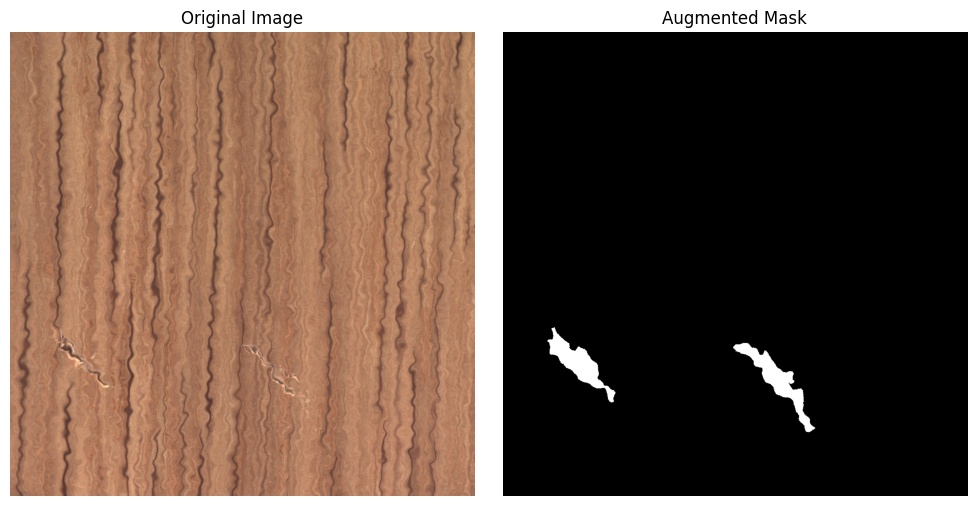

In [51]:
import matplotlib.pyplot as plt

# Define the index you want to visualize
index_to_visualize = 362

# Get the image and mask paths for the selected index
image_path = concatenated_df.loc[index_to_visualize, 'image_path']
mask_path = concatenated_df.loc[index_to_visualize, 'mask_path']

# Load the image and mask using PIL
image = Image.open(image_path)
mask = Image.open(mask_path)

# Create a subplot to display the image and mask side by side
plt.figure(figsize=(10, 5))

# Display the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

# Display the augmented mask
plt.subplot(1, 2, 2)
plt.title('Augmented Mask')
plt.imshow(mask, cmap='gray')  # Use 'gray' colormap for grayscale masks
plt.axis('off')

# Show the plots
plt.tight_layout()
plt.show()

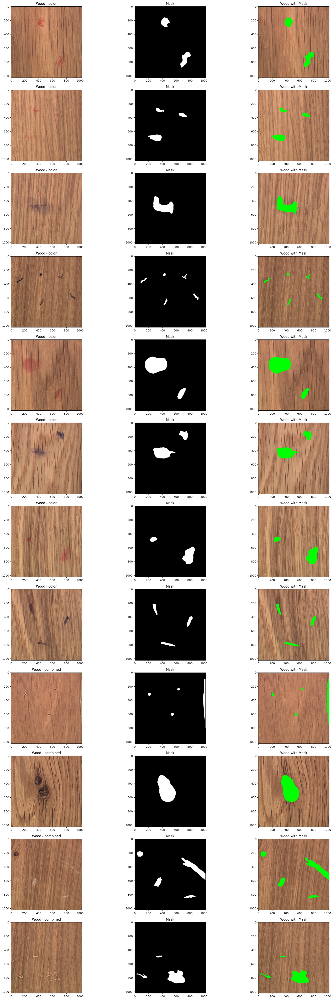

In [52]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(df)):
  if concatenated_df['mask'][i] ==1 and count <12:
    img = io.imread(concatenated_df.image_path[i])
    axs[count][0].title.set_text("Wood - " + str(concatenated_df['categories'][i]))
    axs[count][0].imshow(img)

    mask = io.imread(concatenated_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')


    img[mask == 255] = (0, 255, 0)
    axs[count][2].title.set_text('Wood with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()

TRAIN A CLASSIFIER MODEL TO DETECT IF DEFECTED OR NOT

In [53]:
df_train = concatenated_df
df_train.shape

(566, 4)

In [54]:
df_train['mask'] = df_train['mask'].apply(lambda x: str(x))

In [55]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  566 non-null    object
 1   mask_path   566 non-null    object
 2   categories  566 non-null    object
 3   mask        566 non-null    object
dtypes: object(4)
memory usage: 17.8+ KB


In [56]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df_train, test_size = 0.2)

In [57]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes a validation split of 0.2
datagen = ImageDataGenerator(
    rescale=1./255.,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2
)

In [58]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))

Found 362 validated image filenames belonging to 2 classes.
Found 90 validated image filenames belonging to 2 classes.
Found 114 validated image filenames belonging to 2 classes.


In [59]:
# Load the InceptionV3 model
basemodel = InceptionV3(weights='imagenet', include_top=False, input_tensor=Input(shape=(256, 256, 3)))

87910968/87910968 [==============================] - 5s 0us/step


In [60]:
basemodel.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 127, 127, 32)         0         ['batch_normalizati

In [61]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [62]:
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D()(headmodel)
headmodel = Dense(256, activation='relu')(headmodel)
headmodel = Dropout(0.3)(headmodel)
output_layer = Dense(2, activation='softmax')(headmodel)
model = Model(inputs=basemodel.input, outputs=output_layer)

In [63]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [73]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

# Specify an absolute path for saving the weights
checkpoint_path = '/content/classifier-resnet-weights.hdf5'

# Update the ModelCheckpoint callback
checkpointer = ModelCheckpoint(filepath=checkpoint_path, verbose=1, save_best_only=True)

# Use the updated checkpoint path in the fit function
history = model.fit(train_generator, steps_per_epoch=train_generator.n // 16, epochs=25, validation_data=valid_generator, validation_steps=valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

Epoch 1/25
22/22 [==============================] - ETA: 0s - loss: 0.2517 - accuracy: 0.9191
Epoch 1: val_loss improved from inf to 1.21667, saving model to /content/classifier-resnet-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


22/22 [==============================] - 82s 4s/step - loss: 0.2517 - accuracy: 0.9191 - val_loss: 1.2167 - val_accuracy: 0.6250
Epoch 2/25
22/22 [==============================] - ETA: 0s - loss: 0.1093 - accuracy: 0.9711
Epoch 2: val_loss improved from 1.21667 to 1.13242, saving model to /content/classifier-resnet-weights.hdf5
22/22 [==============================] - 30s 1s/step - loss: 0.1093 - accuracy: 0.9711 - val_loss: 1.1324 - val_accuracy: 0.6375
Epoch 3/25
22/22 [==============================] - ETA: 0s - loss: 0.1371 - accuracy: 0.9682
Epoch 3: val_loss did not improve from 1.13242
22/22 [==============================] - 32s 1s/step - loss: 0.1371 - accuracy: 0.9682 - val_loss: 78.0729 - val_accuracy: 0.6125
Epoch 4/25
22/22 [==============================] - ETA: 0s - loss: 0.1368 - accuracy: 0.9566
Epoch 4: val_loss did not improve from 1.13242
22/22 [==============================] - 29s 1s/step - loss: 0.1368 - accuracy: 0.9566 - val_loss: 28.5039 - val_accuracy: 0.512

In [74]:
# save the model architecture to json file

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json)

ASSESS TRAINED MODEL PERFORMANCE

In [75]:
# make prediction

test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

7/7 [==============================] - 50s 8s/step


In [76]:
test_predict.shape

(112, 2)

In [77]:
# Obtain the predicted class from the model
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [78]:
predict

array(['1', '0', '0', '1', '0', '0', '0', '1', '1', '0', '0', '0', '0',
       '1', '0', '1', '0', '1', '0', '1', '0', '1', '1', '1', '0', '0',
       '0', '0', '1', '0', '1', '1', '1', '1', '1', '0', '1', '0', '1',
       '0', '1', '1', '0', '1', '1', '0', '1', '0', '0', '1', '0', '0',
       '1', '1', '0', '1', '0', '1', '1', '0', '0', '1', '0', '0', '1',
       '1', '1', '0', '1', '1', '1', '0', '1', '1', '1', '1', '0', '0',
       '1', '0', '1', '1', '1', '1', '1', '0', '0', '1', '1', '1', '0',
       '1', '0', '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0',
       '0', '0', '0', '1', '1', '0', '0', '1'], dtype='<U1')

In [80]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

112

In [81]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9821428571428571

<Axes: >

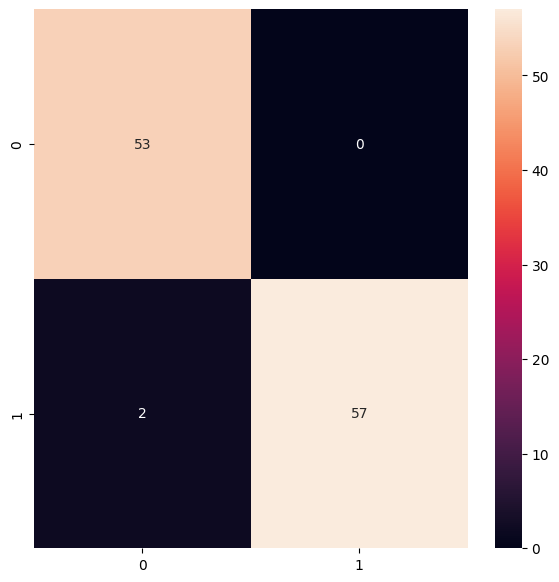

In [82]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [83]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        53
           1       1.00      0.97      0.98        59

   micro avg       0.98      0.98      0.98       112
   macro avg       0.98      0.98      0.98       112
weighted avg       0.98      0.98      0.98       112



BUILD A SEGMENTATION MODEL TO LOCALIZE THE DEFECTION

In [84]:
concatenated_df['mask'] = concatenated_df['mask'].apply(lambda x: int(x))

In [85]:
# Get the dataframe containing Woods defected which have masks associated with them.
wood_df_mask = concatenated_df[concatenated_df['mask']==1]
wood_df_mask.shape

(300, 4)

In [86]:
wood_df_mask

,image_path,mask_path,categories,mask
266,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
267,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
268,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
269,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
270,/content/drive/MyDrive/mvtec-wood/wood/test/co...,/content/drive/MyDrive/mvtec-wood/wood/ground_...,color,1
...,...,...,...,...
561,/content/aug/image/color_267_aug_3.png,/content/aug/mask/color_267_aug_mask_3.png,color,1
562,/content/aug/image/combined_282_aug_1.png,/content/aug/mask/combined_282_aug_mask_1.png,combined,1
563,/content/aug/image/liquid_296_aug_1.png,/content/aug/mask/liquid_296_aug_mask_1.png,liquid,1
564,/content/aug/image/combined_282_aug_0.png,/content/aug/mask/combined_282_aug_mask_0.png,combined,1


In [87]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(wood_df_mask, test_size=0.2)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [88]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [90]:
#creating a custom datagenerator:

import cv2
import numpy as np
import tensorflow as tf
from skimage import io

# Creating a custom datagenerator
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, ids, mask, image_dir='./', batch_size=16, img_h=256, img_w=256, shuffle=True):
        self.ids = ids
        self.mask = mask
        self.image_dir = image_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.ids)) / self.batch_size)

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
        list_ids = [self.ids[i] for i in indexes]
        list_mask = [self.mask[i] for i in indexes]
        X, y = self.__data_generation(list_ids, list_mask)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.ids))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_ids, list_mask):
        X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
        y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

        for i in range(len(list_ids)):
            img_path = list_ids[i]
            mask_path = list_mask[i]
            img = io.imread(img_path)
            mask = io.imread(mask_path)
            img = cv2.resize(img, (self.img_h, self.img_w))
            img = np.array(img, dtype=np.float64)
            mask = cv2.resize(mask, (self.img_h, self.img_w))
            mask = np.array(mask, dtype=np.float64)

            img -= img.mean()
            img /= img.std()
            mask -= mask.mean()
            mask /= mask.std()

            X[i,] = img
            y[i,] = np.expand_dims(mask, axis=2)

        y = (y > 0).astype(int)

        return X, y

In [91]:
def prediction(test, model, model_seg):
    directory = "./"
    mask = []
    image_id = []
    has_mask = []

    for i in test.image_path:
        path = i
        img = io.imread(path)
        img = img * 1.0 / 255.
        img = cv2.resize(img, (256, 256))
        img = np.array(img, dtype=np.float64)
        img = np.reshape(img, (1, 256, 256, 3))
        is_defect = model.predict(img)

        if np.argmax(is_defect) == 0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
            continue

        img = io.imread(path)
        X = np.empty((1, 256, 256, 3))
        img = cv2.resize(img, (256, 256))
        img = np.array(img, dtype=np.float64)
        img -= img.mean()
        img /= img.std()
        X[0,] = img
        predict = model_seg.predict(X)

        if predict.round().astype(int).sum() == 0:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
        else:
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)

    return image_id, mask, has_mask

In [92]:
def tversky(y_true, y_pred):
    smooth = 1.0  # Use a float value for smooth
    y_true_pos = K.flatten(K.cast(y_true, 'float32'))
    y_pred_pos = K.flatten(K.cast(y_pred, 'float32'))
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [93]:
training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [94]:
def resblock(X, f):


  # make a copy of input
  X_copy = X
  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [95]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [96]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(64,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(64,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 128)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 256)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 512)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 1024)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 512)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 256)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 128)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 64)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )

In [97]:
model_seg.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 256, 256, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 256, 256, 64)         256       ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 conv2d_95 (Conv2D)          (None, 256, 256, 64)         36928     ['batch_normalization_94

TRAIN A SEGMENTATION RESUNET MODEL TO LOCALIZE DEFECTION

In [98]:
# Compile the model
adam = tf.keras.optimizers.Adam(lr = 1e-4, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [99]:
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.hdf5", verbose=1, save_best_only=True)

In [100]:
history = model_seg.fit(training_generator, epochs = 100, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

Epoch 1/100
15/15 [==============================] - ETA: 0s - loss: 0.9124 - tversky: 0.1149
Epoch 1: val_loss improved from inf to 0.93196, saving model to ResUNet-weights.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


15/15 [==============================] - 59s 1s/step - loss: 0.9124 - tversky: 0.1149 - val_loss: 0.9320 - val_tversky: 0.0897
Epoch 2/100
15/15 [==============================] - ETA: 0s - loss: 0.9068 - tversky: 0.1221
Epoch 2: val_loss improved from 0.93196 to 0.90276, saving model to ResUNet-weights.hdf5
15/15 [==============================] - 21s 1s/step - loss: 0.9068 - tversky: 0.1221 - val_loss: 0.9028 - val_tversky: 0.1275
Epoch 3/100
15/15 [==============================] - ETA: 0s - loss: 0.8983 - tversky: 0.1330
Epoch 3: val_loss improved from 0.90276 to 0.85766, saving model to ResUNet-weights.hdf5
15/15 [==============================] - 20s 1s/step - loss: 0.8983 - tversky: 0.1330 - val_loss: 0.8577 - val_tversky: 0.1851
Epoch 4/100
15/15 [==============================] - ETA: 0s - loss: 0.8889 - tversky: 0.1450
Epoch 4: val_loss did not improve from 0.85766
15/15 [==============================] - 18s 1s/step - loss: 0.8889 - tversky: 0.1450 - val_loss: 0.8790 - val_t

In [101]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open("ResUNet-model.json","w") as json_file:
  json_file.write(model_json)

ASSESS TRAINED SEGMENTATION RESUNET MODEL PERFORMANCE

In [102]:
# Utilities file contains the code for custom loss function and custom data generator
# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 [==============================] - 0s 37ms/step


In [103]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,/content/aug/image/hole_287_aug_3.png,"[[[[0.01403874], [0.05220268], [0.01962794], [...",1
1,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
2,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
3,/content/aug/image/liquid_301_aug_3.png,"[[[[0.00265224], [0.05547843], [0.01493689], [...",1
4,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
...,...,...,...
109,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
110,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0
111,/content/aug/image/color_273_aug_3.png,"[[[[0.00088307], [0.00850741], [0.00460981], [...",1
112,/content/drive/MyDrive/mvtec-wood/wood/train/g...,No mask,0


In [104]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')

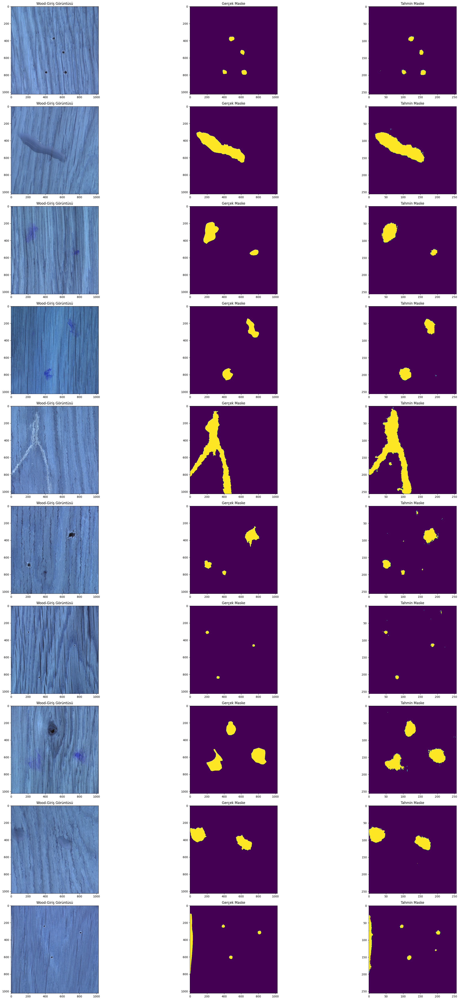

In [106]:
count = 0
fig, axs = plt.subplots(10, 3, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Wood-Giriş Görüntüsü")
    axs[count][0].imshow(img)

    # Obtain the mask for the image
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Gerçek Maske")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("Tahmin Maske")
    axs[count][2].imshow(predicted_mask)
    count += 1

fig.tight_layout()